# Bandit Algorithms

Implementation of the basic multi-armed bandit algorithms of Sutton's Reinforcement Learning textbook. 

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

In [2]:
def softmax(x):
    """ A stable softmax function
    """
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

In [3]:
class MultiArmedBandit:
    def __init__(self, k, noise=None):
        self.k = k  # arms

        # reward per arm
        self.mu = np.arange(k)
        if noise is None:
            self.std = np.random.chisquare(1, k)
        else:
            self.std = noise * np.ones(k)
            
    def get_reward(self, arm, n=1):
        tmp = np.random.randn() if n==1 else np.random.randn(n)
        return self.std[arm] * tmp + self.mu[arm]

In [4]:
k = 10
bandit = MultiArmedBandit(k)

Let's sample these arms and see what the distribution of rewards looks like for each.

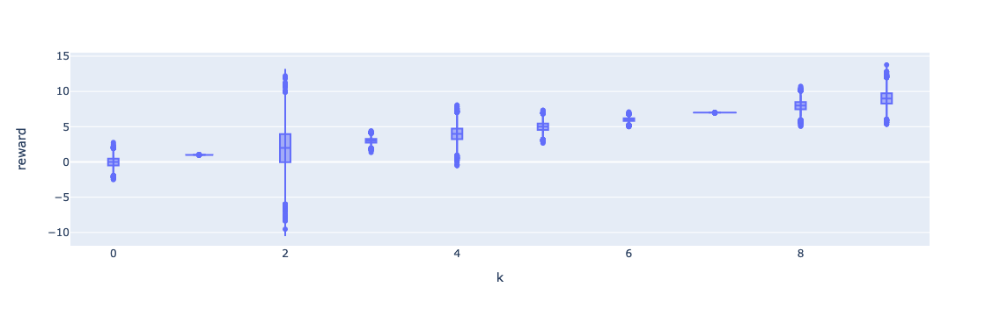

In [5]:
n=10000
rewards = []
arms = []
for arm in range(k):
    arms.extend(arm * np.ones(n))
    rewards.extend(bandit.get_reward(arm, n=n))
df = pd.DataFrame({'k': np.array(arms, dtype=int), 'reward': rewards})
df['k'] = df['k'].astype('category')

px.violin(data_frame=df, x='k', y='reward', box=True)

Compare results across 2000 runs over 1000 steps.

In [6]:
runs = 2000
n = 1000

In [7]:
class EpsGreedy:
    """ Section 2.6 of Sutton
    """
    def __init__(self, eps, k):
        self.eps = eps
        self.k = k
        self.q = np.zeros(k)
        self.n = np.zeros(k)

    def next_action(self):
        if np.random.rand() <= eps:
            return np.random.choice(self.k)
        return self._argmax_Q()

    def update(self, a, r):
        self.n[a] += 1
        self.q[a] += 1 / self.n[a] * (r - self.q[a])

    def _argmax_Q(self):
        q_max = np.max(self.q)
        return np.random.choice(np.where(self.q == q_max)[0])

    def simulate(self, mab, steps):
        rewards = np.zeros(steps)
        for j in range(steps):
            a = self.next_action()
            r = mab.get_reward(a)
            rewards[j] = r
            self.update(a, r)
        return rewards

In [8]:
rewards = {}
for eps in [0.2, 0.1, 0.01, 0]:
    rewards[eps] = np.zeros((runs, n))
    for i in range(runs):
        rewards[eps][i] = EpsGreedy(eps, k).simulate(bandit, n)

In [9]:
class UCB:
    """ Section 2.7 of Sutton
    """
    def __init__(self, c, k):
        self.c = c
        self.k = k
        self.q = np.zeros(k)
        self.n = np.zeros(k)
        self.t = 1

    def next_action(self):
        ucb = self.q + self.c * np.sqrt(np.log(self.t)/(self.n + 1e-6))
        ucb_max = np.max(ucb)
        return np.random.choice(np.where(ucb == ucb_max)[0])

    def update(self, a, r):
        self.n[a] += 1
        self.t += 1
        self.q[a] += 1 / self.n[a] * (r - self.q[a])

    def simulate(self, mab, steps):
        rewards = np.zeros(steps)
        for j in range(steps):
            a = self.next_action()
            r = mab.get_reward(a)
            rewards[j] = r
            self.update(a, r)
        return rewards

In [10]:
rewards_ucb = np.zeros((runs, n))
for i in range(runs):
    rewards_ucb[i] = UCB(2, k).simulate(bandit, n)

In [11]:
class GradientBandit:
    def __init__(self, alpha, k):
        self.alpha = alpha
        self.k = k
        self.h = np.zeros(k)
        self.p = softmax(self.h)
        self.t = 1
        self.sum_r = None
    
    def next_action(self):
        """ Preference selection for the gradient bandit
        """
        return np.random.choice(self.k, p=self.p)

    def update(self, a, r):
        mean_r = 0 if self.sum_r is None else self.sum_r / self.t
        dr = self.alpha * (r - mean_r)
        self.h -= dr * self.p
        self.h[a] += dr 
        self.p = softmax(self.h)
        
    def simulate(self, mab, steps):
        """ Section 2.8 of Sutton
        """
        rewards = np.zeros(steps)
        for j in range(steps):
            a = self.next_action()
            r = mab.get_reward(a)
            rewards[j] = r
            self.update(a, r)
        return rewards

In [12]:
rewards_h = {}
for alpha in [0.4, 0.1, 0.05]:
    rewards_h[alpha] = np.zeros((runs, n))
    for i in range(runs):
        rewards_h[alpha][i] = GradientBandit(alpha, k).simulate(bandit, n)

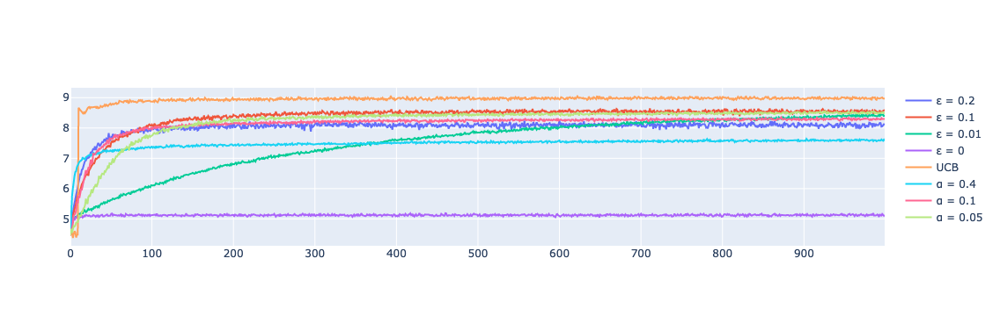

In [13]:
px.line(x=np.arange(n), y=np.mean(rewards_ucb, axis=0))
fig = go.Figure(data= [
    go.Scatter(x=np.arange(n), y=np.mean(rewards[0.2], axis=0), name='ε = 0.2'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards[0.1], axis=0), name='ε = 0.1'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards[0.01], axis=0), name='ε = 0.01'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards[0], axis=0), name='ε = 0'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards_ucb, axis=0), name='UCB'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards_h[0.4], axis=0), name='α = 0.4'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards_h[0.1], axis=0), name='α = 0.1'),
    go.Scatter(x=np.arange(n), y=np.mean(rewards_h[0.05], axis=0), name='α = 0.05'),
]).show()

UCB wins!